In [1]:
# STEP 0: SETUP
from google.colab import drive
drive.mount('/content/drive')

# Fix numpy-librosa compatibility
import numpy as np
np.complex = complex

# Imports
import os
import pandas as pd
import librosa
from tqdm import tqdm
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import adjusted_rand_score
import joblib

# Paths
BASE_DIR = '/content/drive/MyDrive/audio-clustering-2402-mtl-782'
DATASET_DIR = os.path.join(BASE_DIR, 'Dataset')
TRAIN_FOLDER = os.path.join(DATASET_DIR, 'train_folder')
LABELS_PATH = os.path.join(DATASET_DIR, 'train_labels.csv')

# Load label mapping
df_labels = pd.read_csv(LABELS_PATH)
df_labels.sort_values('filename', inplace=True)  # Ensure fixed order



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
# STEP 1: FEATURE EXTRACTION
import librosa
import numpy as np
from scipy.stats import skew, kurtosis

import librosa
import numpy as np

def extract_features(file_path):
    y, sr = librosa.load(file_path, sr=None)
    features = {}

    # --- MFCCs ---
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=20)
    mfccs_delta = librosa.feature.delta(mfccs)
    mfccs_delta2 = librosa.feature.delta(mfccs, order=2)

    for i in range(20):
        features[f'mfcc_{i+1}_mean'] = np.mean(mfccs[i])
        features[f'mfcc_{i+1}_var'] = np.var(mfccs[i])
        features[f'delta_{i+1}_mean'] = np.mean(mfccs_delta[i])
        features[f'delta2_{i+1}_mean'] = np.mean(mfccs_delta2[i])

    # --- Zero Crossing Rate ---
    zcr = librosa.feature.zero_crossing_rate(y)[0]
    features['zcr_mean'] = np.mean(zcr)
    features['zcr_var'] = np.var(zcr)

    # --- Spectral Centroid ---
    sc = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
    features['spec_centroid_mean'] = np.mean(sc)
    features['spec_centroid_var'] = np.var(sc)

    # --- Spectral Bandwidth ---
    bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)[0]
    features['spec_bw_mean'] = np.mean(bw)
    features['spec_bw_var'] = np.var(bw)

    # --- Root Mean Square Energy ---
    rms = librosa.feature.rms(y=y)[0]
    features['rms_mean'] = np.mean(rms)
    features['rms_var'] = np.var(rms)

    # --- Tempo and IOI (Inter-Onset Interval) ---
    onset_env = librosa.onset.onset_strength(y=y, sr=sr)
    onset_frames = librosa.onset.onset_detect(onset_envelope=onset_env, sr=sr)
    onset_times = librosa.frames_to_time(onset_frames, sr=sr)
    iois = np.diff(onset_times)

    features['tempo'] = librosa.beat.tempo(onset_envelope=onset_env, sr=sr)[0]
    features['ioi_mean'] = np.mean(iois) if len(iois) > 0 else 0
    features['ioi_var'] = np.var(iois) if len(iois) > 0 else 0

    return features

# Extract features for all 1500 files
all_features = []
for _, row in tqdm(df_labels.iterrows(), total=len(df_labels)):
    fname = row['filename']
    category = row['category']
    path = os.path.join(TRAIN_FOLDER, fname)
    try:
        feats = extract_features(path)
        feats['filename'] = fname
        feats['category'] = category
        all_features.append(feats)
    except Exception as e:
        print(f"⚠️ Failed: {fname} — {e}")

df_all = pd.DataFrame(all_features)
df_all.to_csv(os.path.join(BASE_DIR, 'features_all.csv'), index=False)



  0%|          | 0/1500 [00:00<?, ?it/s]<ipython-input-2-e4095c541d05>:50: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  features['tempo'] = librosa.beat.tempo(onset_envelope=onset_env, sr=sr)[0]
100%|██████████| 1500/1500 [10:25<00:00,  2.40it/s]


In [31]:
from google.colab import files

In [ ]:
# STEP 2: SPLITTING DATA (900/300/300)

## df_all_normalized = pd.read_csv(YOUR PATH TO FeaturesNC.csv) ## this is normalized 
df_all = pd.read_csv(os.path.join(BASE_DIR, 'features_all.csv'))
df_all = df_all.sort_values('filename')  # Important to avoid shuffling

df_train = df_all.iloc[:900]
df_val = df_all.iloc[900:1200]
df_test = df_all.iloc[1200:1500]

X_train = df_train.drop(['filename', 'category'], axis=1)
y_train = df_train['category']

X_val = df_val.drop(['filename', 'category'], axis=1)
y_val = df_val['category']

X_test = df_test.drop(['filename', 'category'], axis=1)
y_test = df_test['category']


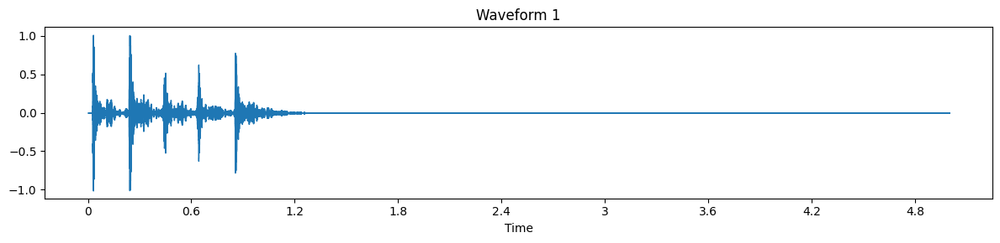

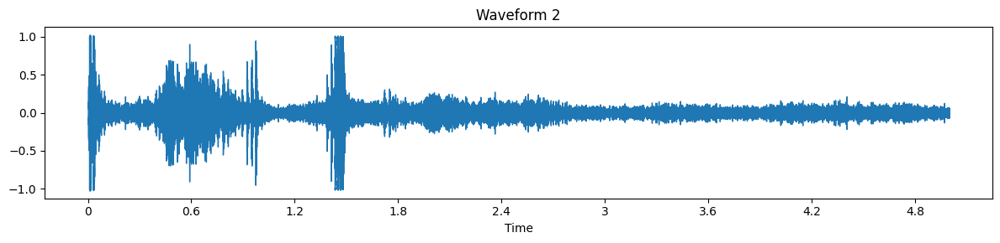

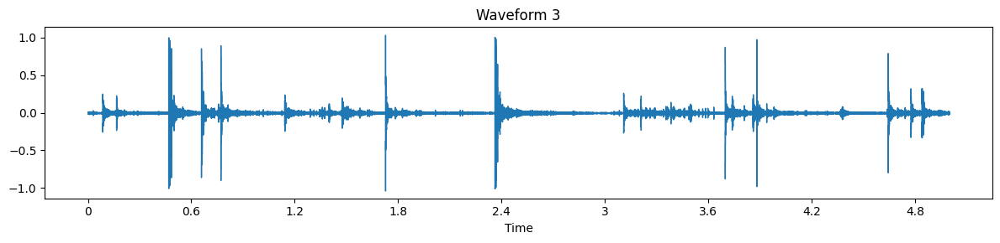

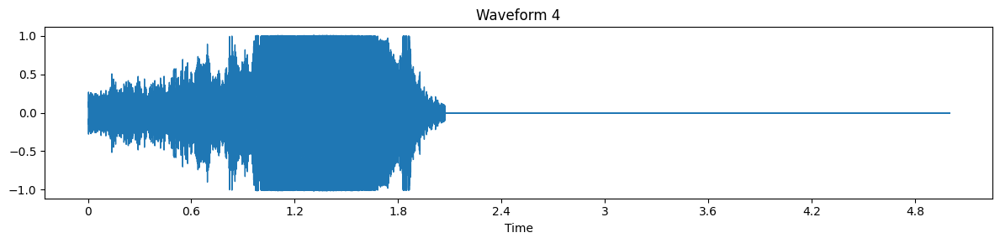

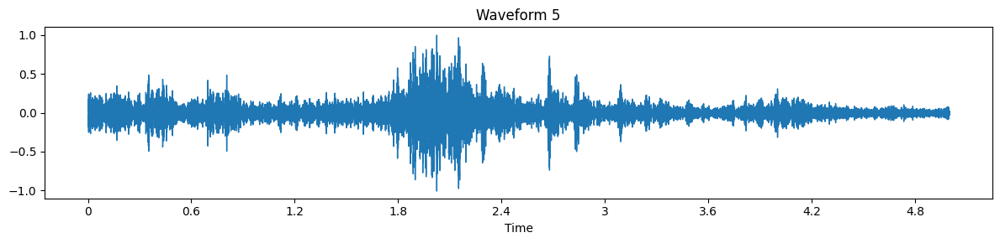

In [4]:
# --- EDA Before Normalization: Raw Feature Understanding ---
import os
import numpy as np
import pandas as pd
import librosa
import librosa.display
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import LabelEncoder
from sklearn.feature_selection import mutual_info_classif
from sklearn.ensemble import RandomForestClassifier

# Prepare merged dataframe
df_train_raw = pd.concat([X_train.reset_index(drop=True), y_train.reset_index(drop=True)], axis=1)

# === 1. Waveforms ===
sample_paths = df_labels.iloc[:900].reset_index(drop=True)['filename'].iloc[:5].apply(lambda fn: os.path.join(TRAIN_FOLDER, fn))
for i, fp in enumerate(sample_paths):
    y, sr = librosa.load(fp)
    plt.figure(figsize=(12, 3))
    librosa.display.waveshow(y, sr=sr)
    plt.title(f'Waveform {i+1}')
    plt.tight_layout()
    plt.show()



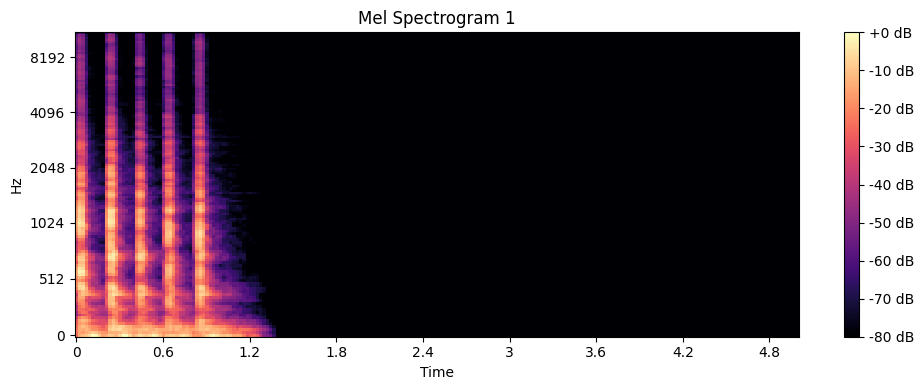

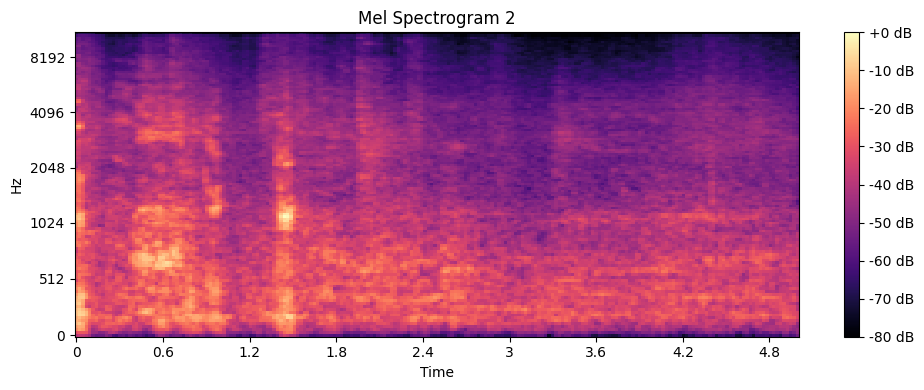

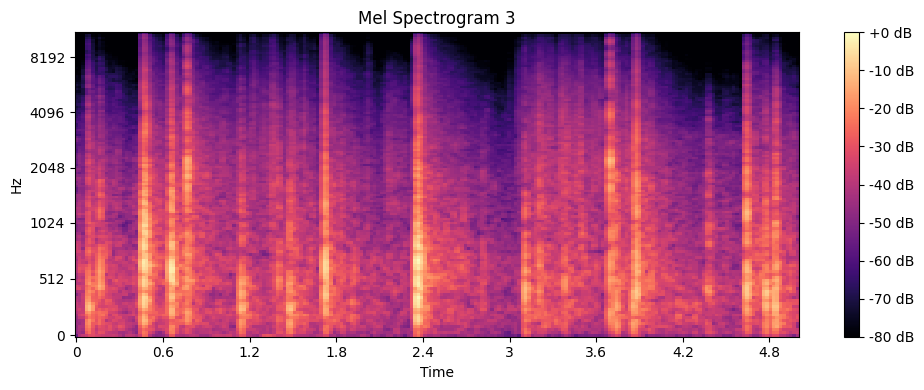

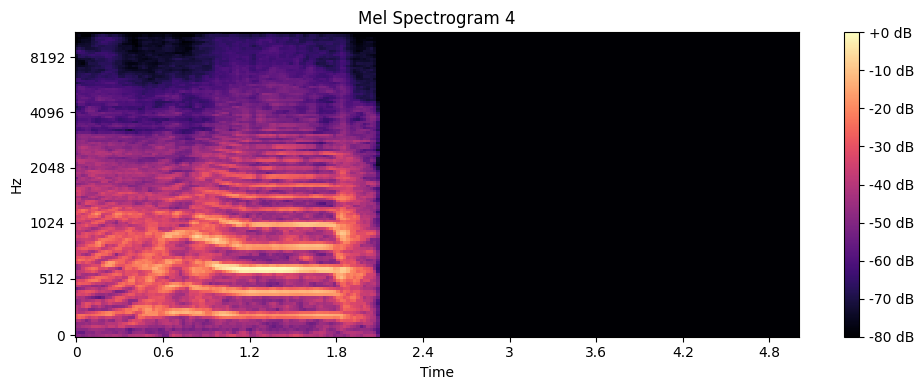

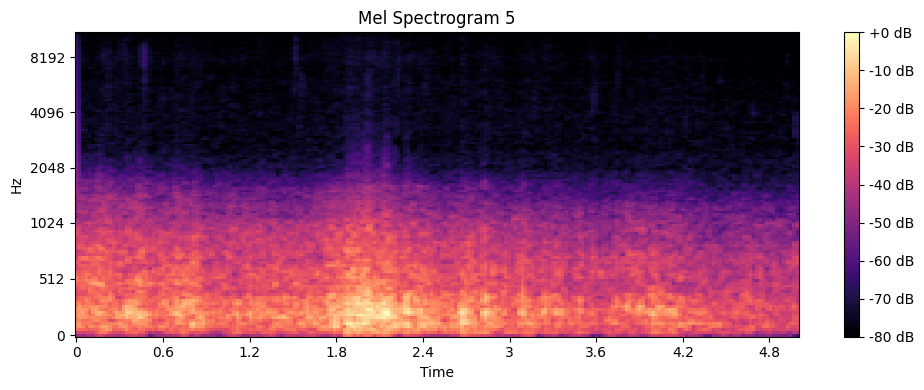

In [5]:
# === 2. Mel Spectrograms ===
for i, fp in enumerate(sample_paths):
    y, sr = librosa.load(fp)
    S = librosa.feature.melspectrogram(y=y, sr=sr)
    S_dB = librosa.power_to_db(S, ref=np.max)
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Mel Spectrogram {i+1}')
    plt.tight_layout()
    plt.show()



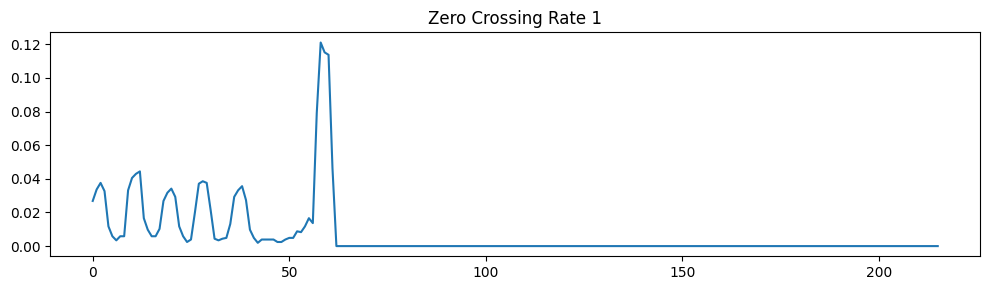

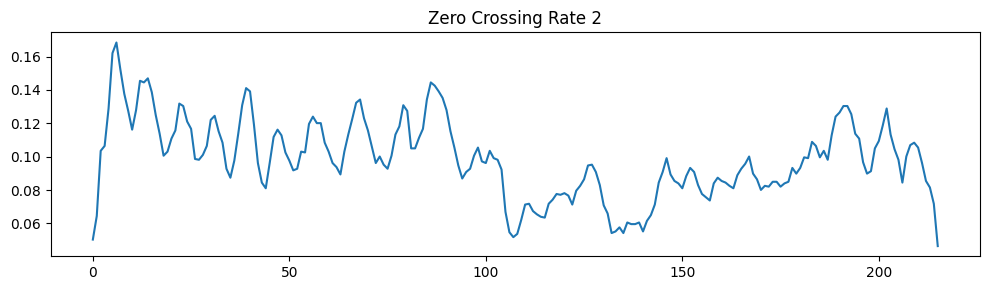

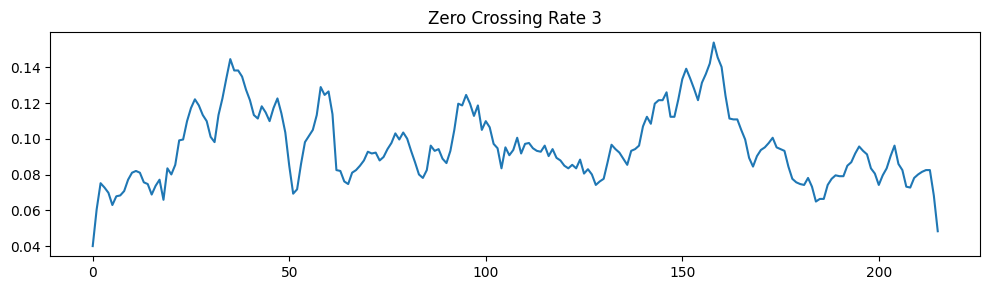

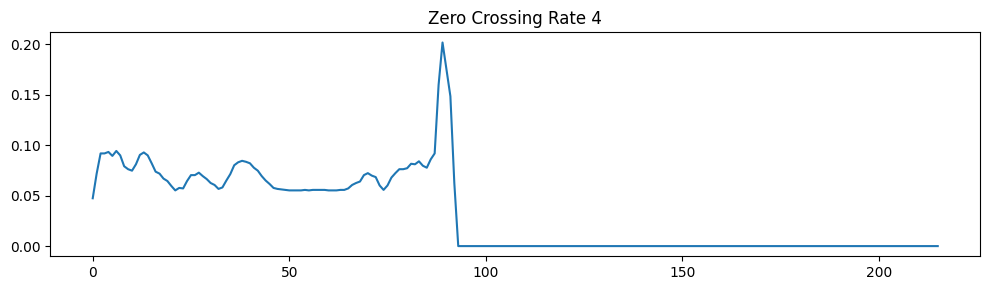

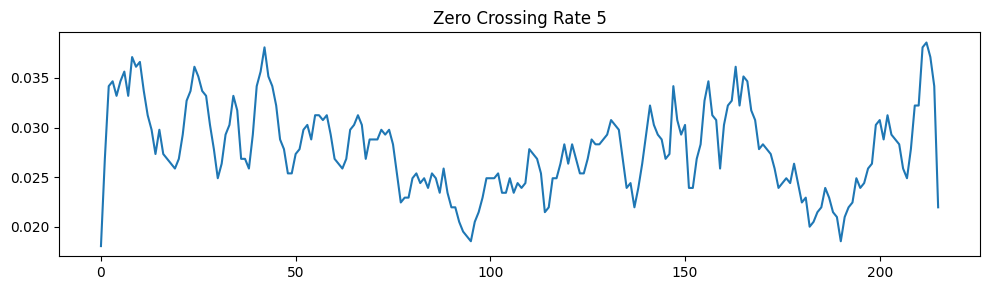

In [6]:
# === 3. Zero Crossing Rate Plots ===
for i, fp in enumerate(sample_paths):
    y, sr = librosa.load(fp)
    zcr = librosa.feature.zero_crossing_rate(y)[0]
    plt.figure(figsize=(10, 3))
    plt.plot(zcr)
    plt.title(f'Zero Crossing Rate {i+1}')
    plt.tight_layout()
    plt.show()



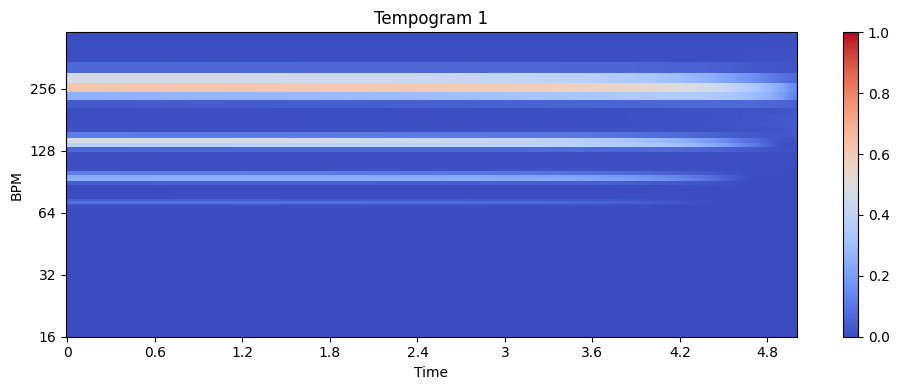

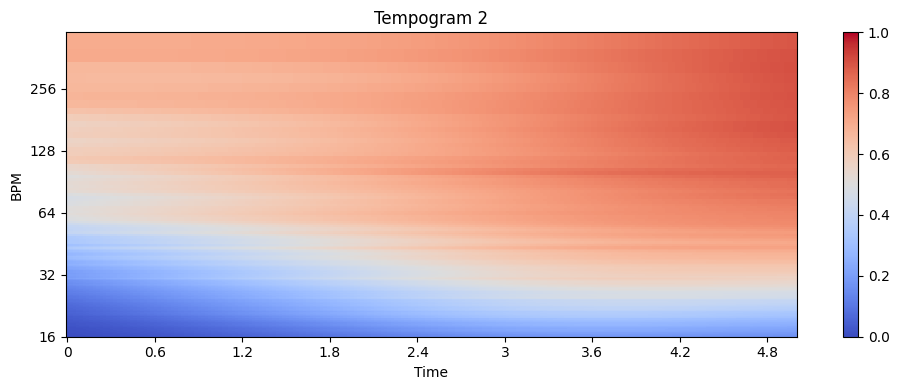

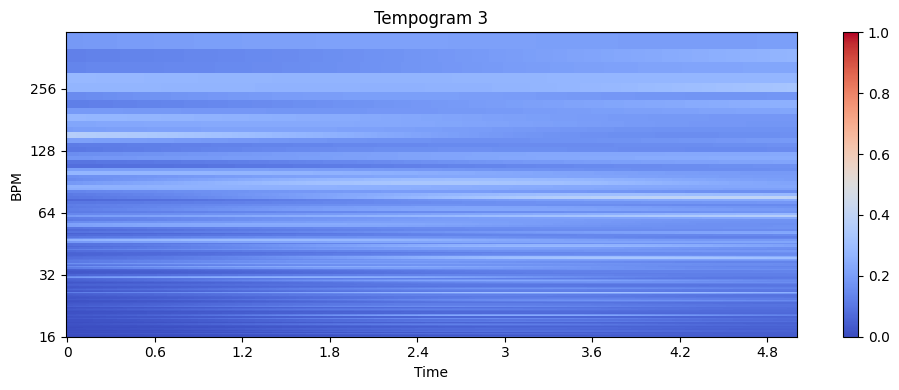

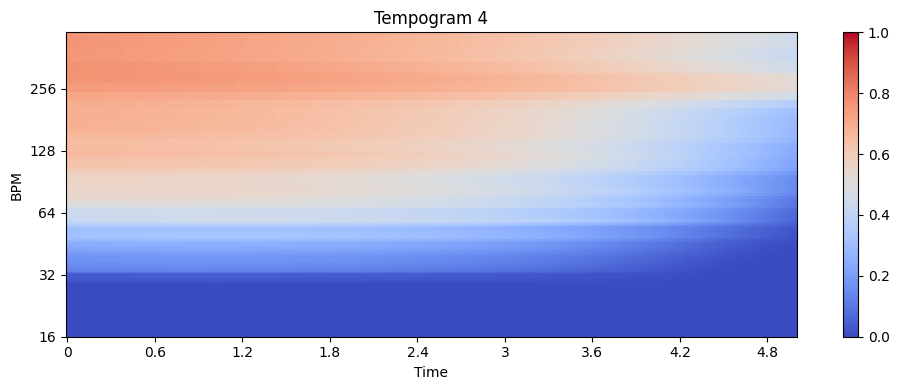

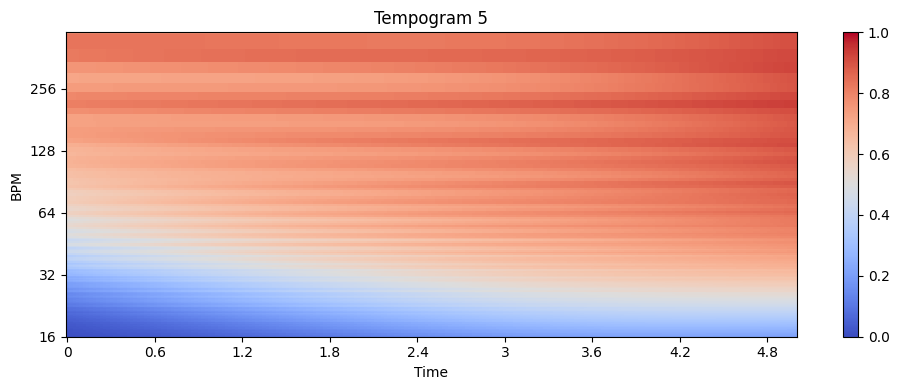

In [7]:
# === 4. Tempograms ===
for i, fp in enumerate(sample_paths):
    y, sr = librosa.load(fp)
    oenv = librosa.onset.onset_strength(y=y, sr=sr)
    tempogram = librosa.feature.tempogram(onset_envelope=oenv, sr=sr)
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(tempogram, sr=sr, x_axis='time', y_axis='tempo')
    plt.title(f'Tempogram {i+1}')
    plt.colorbar()
    plt.tight_layout()
    plt.show()



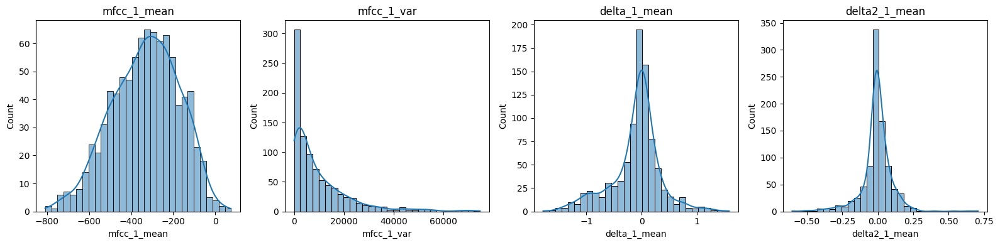

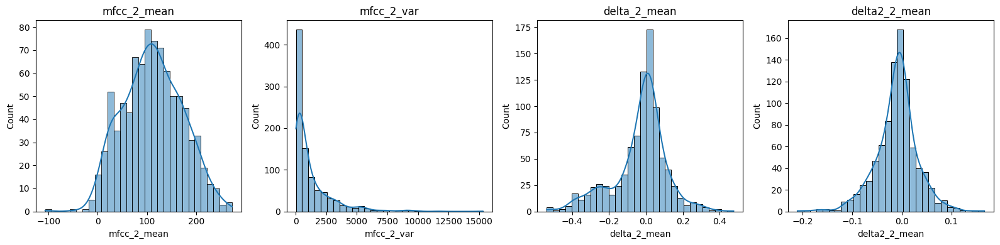

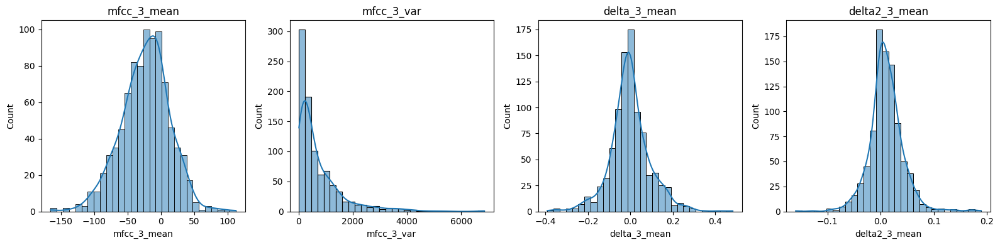

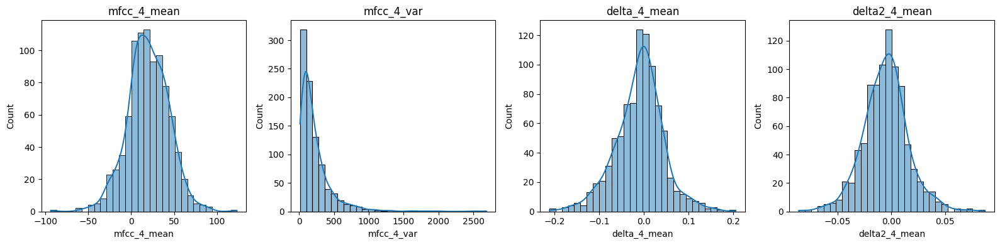

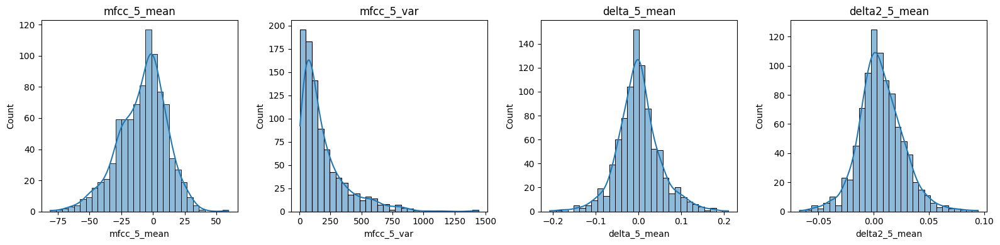

...

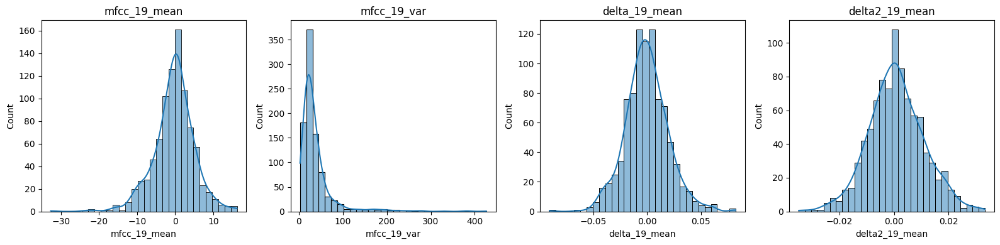

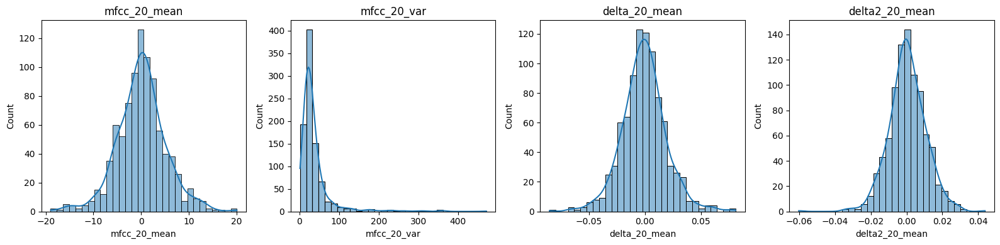

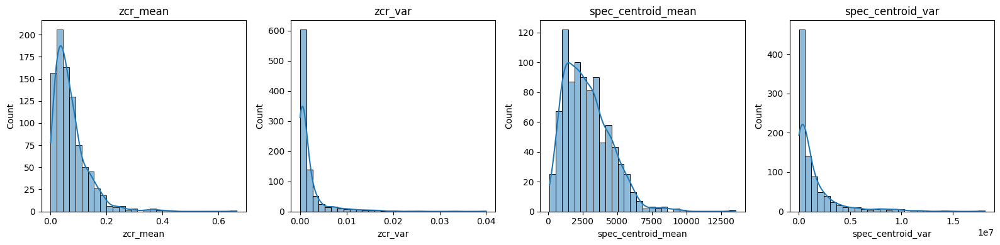

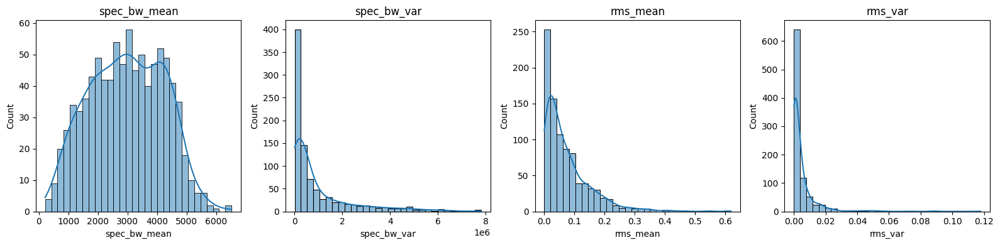

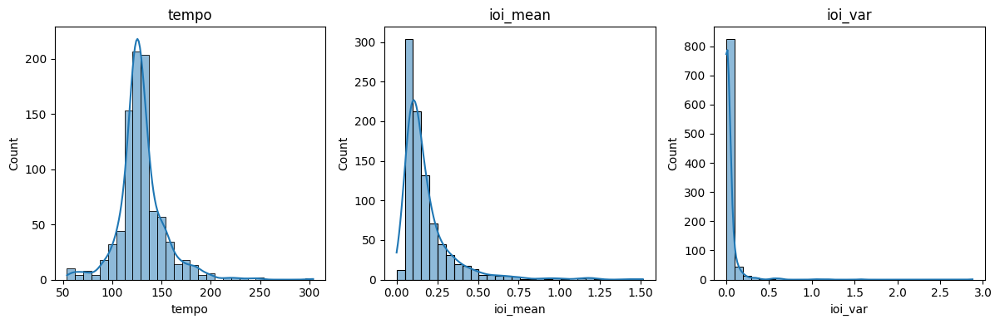

In [8]:
# === 5. Histograms of Feature Distributions ===
import matplotlib.pyplot as plt
import seaborn as sns

all_features = X_train.columns.tolist()
batch_size = 4

for i in range(0, len(all_features), batch_size):
    batch_feats = all_features[i:i+batch_size]
    plt.figure(figsize=(16, 4))
    for j, feat in enumerate(batch_feats):
        plt.subplot(1, batch_size, j + 1)
        sns.histplot(X_train[feat], kde=True, bins=30)
        plt.title(feat)
        plt.tight_layout()
    plt.show()



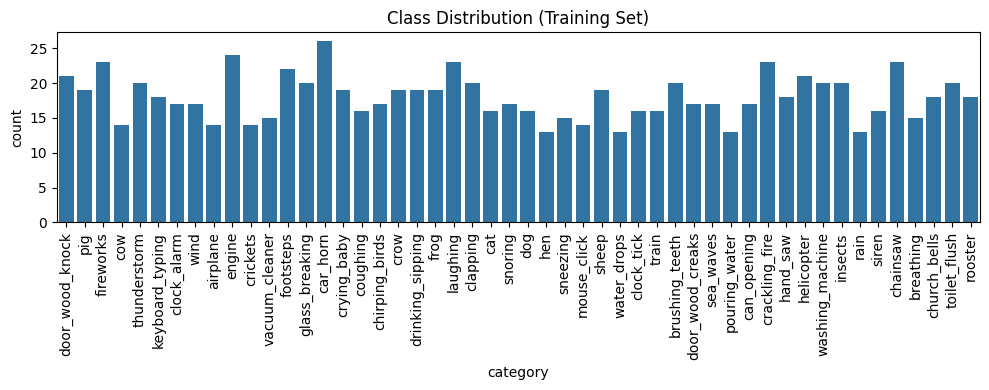

In [9]:
# === 6. Category Distribution ===
plt.figure(figsize=(10, 4))
sns.countplot(x=y_train)
plt.title('Class Distribution (Training Set)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()



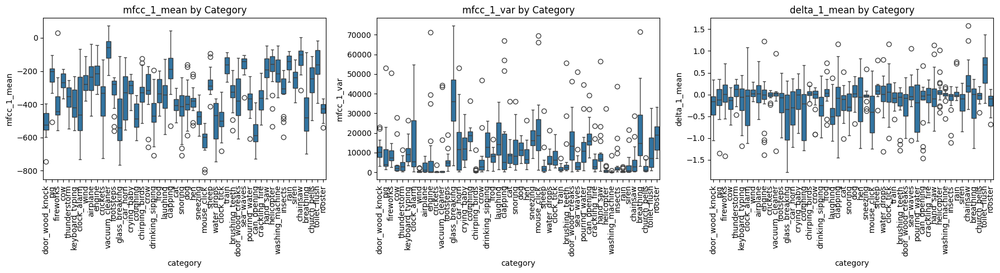

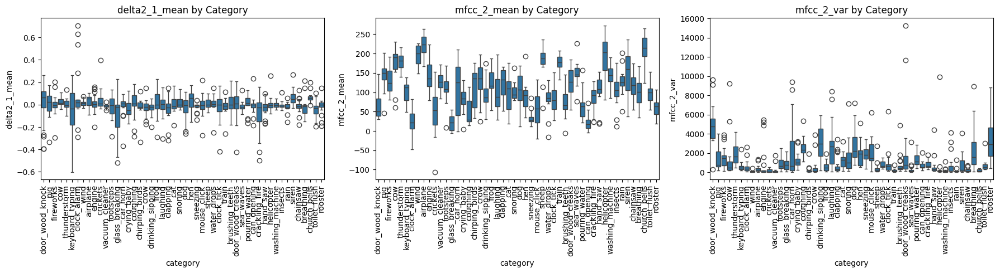

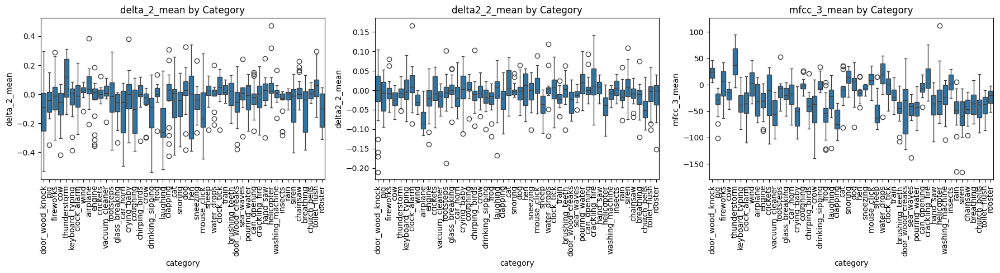

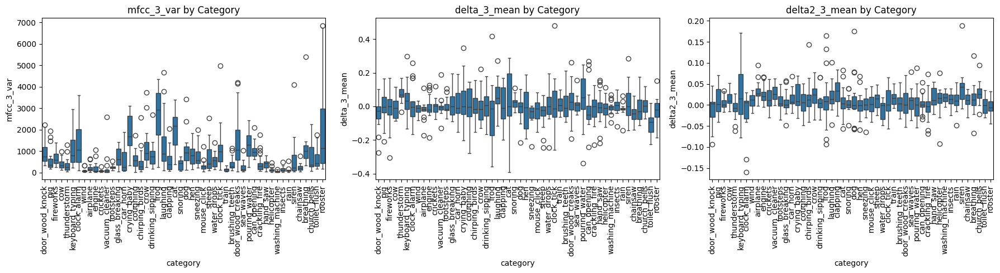

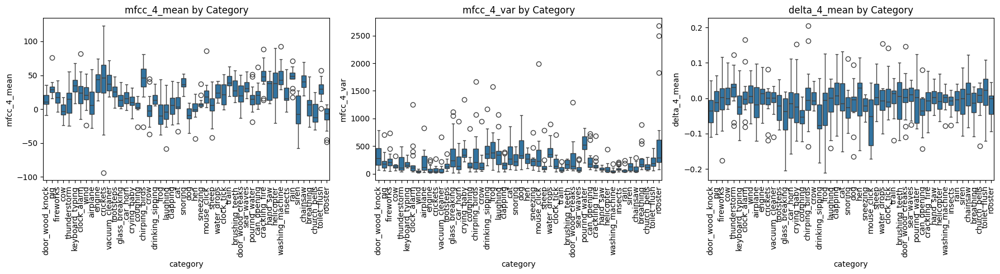

...

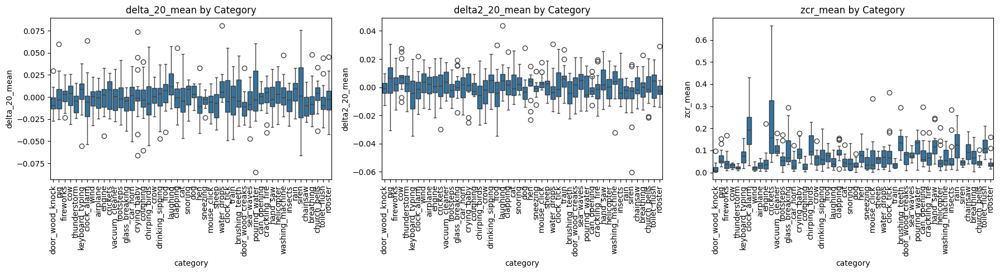

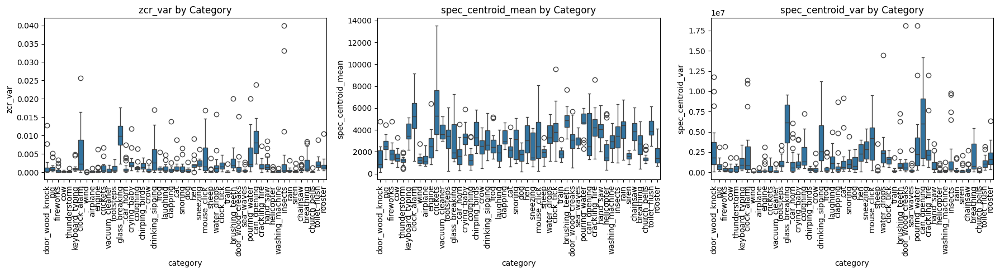

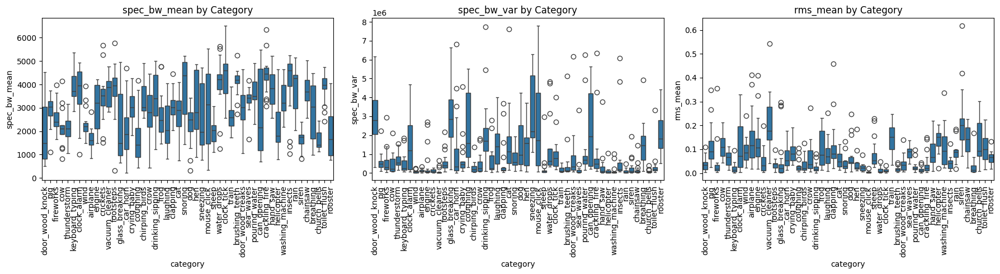

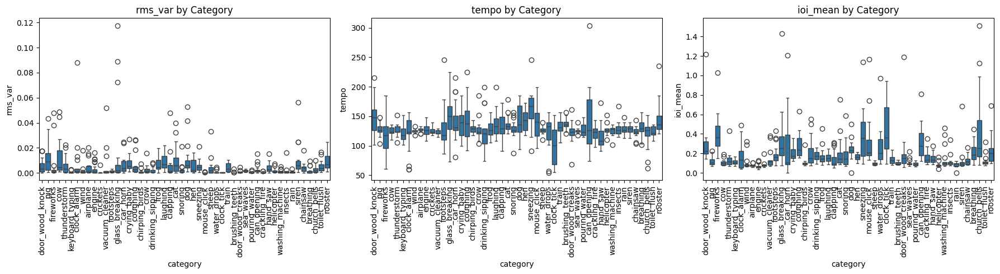

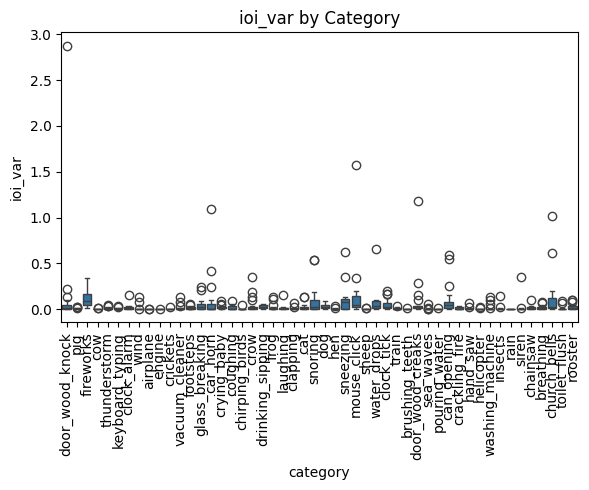

In [10]:
# === 7. Category-wise Separability (Boxplots) ===
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# Merge features and labels into a single DataFrame
df_train_full = X_train.copy()
df_train_full['category'] = y_train.values

# Get all features (excluding 'category')
all_feats = [col for col in df_train_full.columns if col != 'category']
batch_size = 3  # Number of boxplots per figure (change as needed)

for i in range(0, len(all_feats), batch_size):
    batch_feats = all_feats[i:i + batch_size]
    fig, axes = plt.subplots(1, len(batch_feats), figsize=(6 * len(batch_feats), 5))

    if len(batch_feats) == 1:
        axes = [axes]  # Make axes iterable if only one plot

    for ax, feat in zip(axes, batch_feats):
        sns.boxplot(x='category', y=feat, data=df_train_full, ax=ax)
        ax.set_title(f'{feat} by Category')
        ax.tick_params(axis='x', rotation=90)

    plt.tight_layout()
    plt.show()




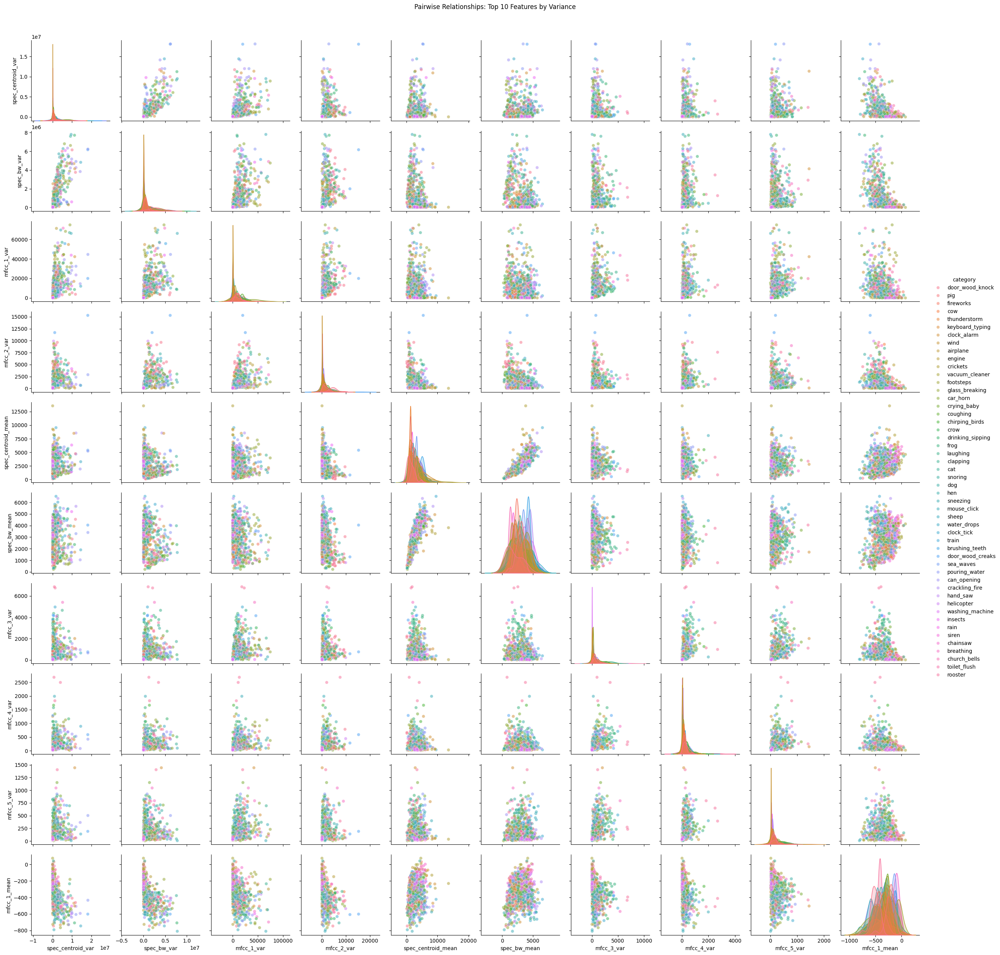

In [11]:
# === 8. Pairwise Feature Relationships ===
from sklearn.preprocessing import LabelEncoder

# Select top 10 features by variance
top_feats = X_train.var().sort_values(ascending=False).head(10).index.tolist()

# Add category column
df_pair = X_train[top_feats].copy()
df_pair['category'] = y_train.values

# Plot pairplot
sns.pairplot(df_pair, hue='category', plot_kws={'alpha': 0.5})
plt.suptitle('Pairwise Relationships: Top 10 Features by Variance', y=1.02)
plt.show()




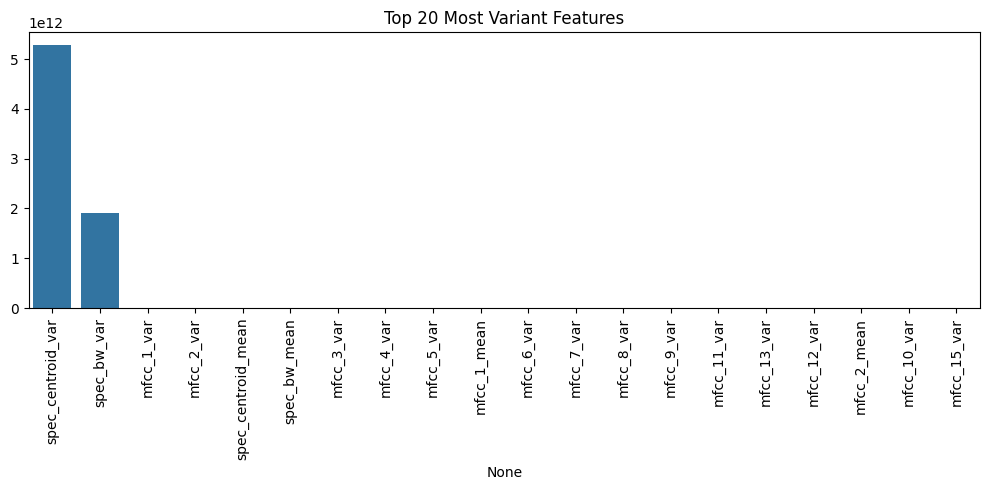

In [12]:
# === 9. Top 20 Most Variant Features ===
top_var = X_train.var().sort_values(ascending=False).head(20)
plt.figure(figsize=(10, 5))
sns.barplot(x=top_var.index, y=top_var.values)
plt.title('Top 20 Most Variant Features')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()



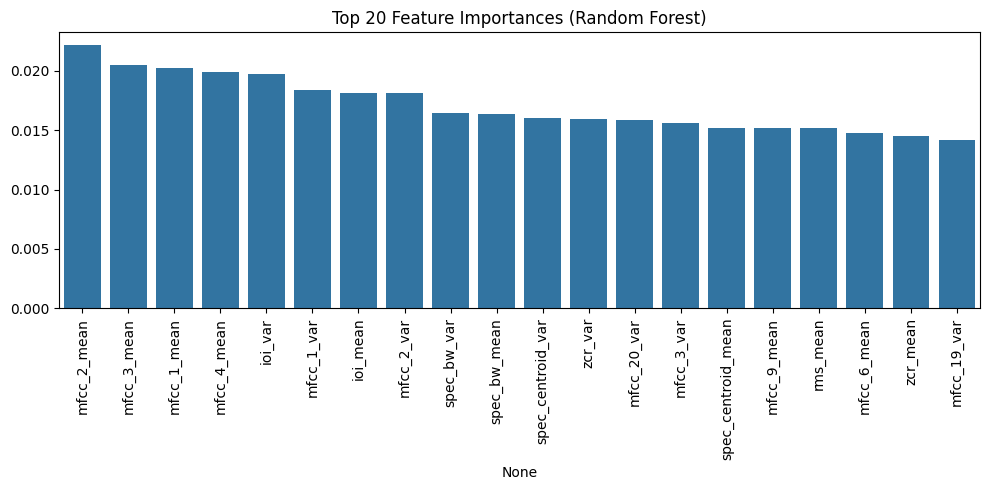

In [13]:
# === 10. Top 20 Features by Random Forest ===
le = LabelEncoder()
y_enc = le.fit_transform(y_train)
rf = RandomForestClassifier(n_estimators=100, random_state=42)
rf.fit(X_train, y_enc)
rf_importances = pd.Series(rf.feature_importances_, index=X_train.columns).sort_values(ascending=False).head(20)

plt.figure(figsize=(10, 5))
sns.barplot(x=rf_importances.index, y=rf_importances.values)
plt.title('Top 20 Feature Importances (Random Forest)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()



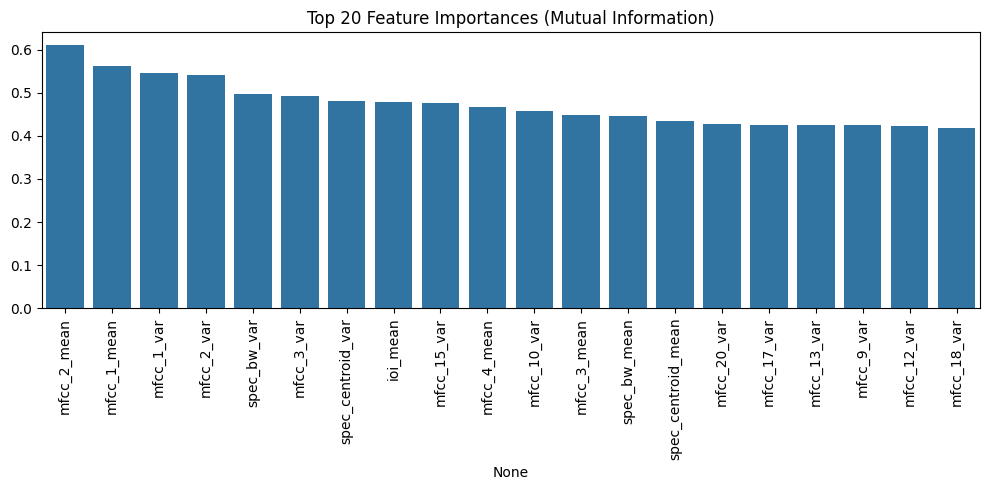

In [14]:
# === 11. Top 20 Features by Mutual Information ===
mi = mutual_info_classif(X_train, y_enc, random_state=42)
mi_series = pd.Series(mi, index=X_train.columns).sort_values(ascending=False).head(20)

plt.figure(figsize=(10, 5))
sns.barplot(x=mi_series.index, y=mi_series.values)
plt.title('Top 20 Feature Importances (Mutual Information)')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [32]:
# Normalize the features
scaler = StandardScaler()

# Create a new DataFrame with the normalized features
df_all_scaled = pd.DataFrame(scaler.fit_transform(df_all.drop(['filename', 'category'], axis=1)), columns=X_train.columns)
df_all_scaled['filename'] = df_all['filename']
df_all_scaled['category'] = df_all['category']

# Save the normalized DataFrame to a CSV file
df_all_scaled.to_csv('FeaturesNC.csv', index=False)


In [15]:
# STEP 3: NORMALIZATION
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

# Save scaler for reuse
joblib.dump(scaler, os.path.join(BASE_DIR, 'train_scaler.pkl'))



['/content/drive/MyDrive/audio-clustering-2402-mtl-782/train_scaler.pkl']

<ipython-input-16-020c67ca4f5f>:13: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


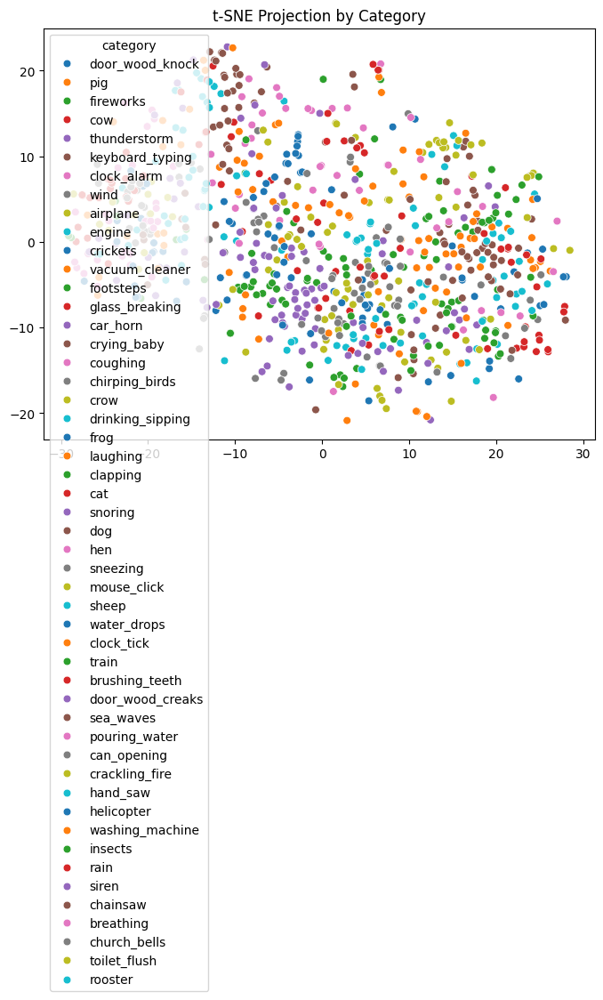

In [16]:
# --- EDA After Normalization: PCA, Clustering, and Distance-based Plots ---
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_samples
from sklearn.cluster import KMeans


# === 2. t-SNE by Category ===
X_tsne_cat = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(X_train_scaled)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_tsne_cat[:, 0], y=X_tsne_cat[:, 1], hue=y_train, palette='tab10', s=40)
plt.title('t-SNE Projection by Category')
plt.tight_layout()
plt.show()



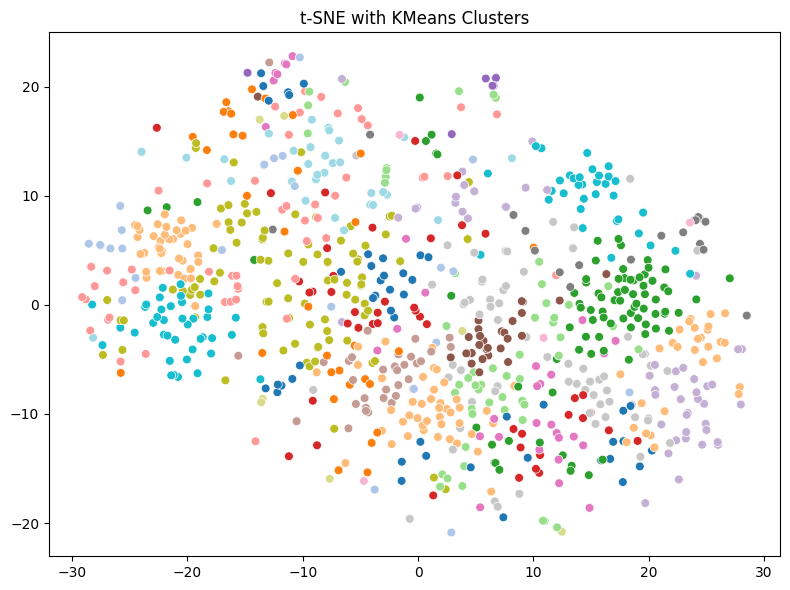

In [17]:
# === 3. t-SNE by KMeans Clustering ===
kmeans = KMeans(n_clusters=50, random_state=42).fit(X_train_scaled)
labels_km = kmeans.labels_

X_tsne_km = TSNE(n_components=2, perplexity=30, random_state=42).fit_transform(X_train_scaled)
plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_tsne_km[:, 0], y=X_tsne_km[:, 1], hue=labels_km, palette='tab20', s=40, legend=False)
plt.title('t-SNE with KMeans Clusters')
plt.tight_layout()
plt.show()



/usr/local/lib/python3.11/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)
/usr/local/lib/python3.11/dist-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


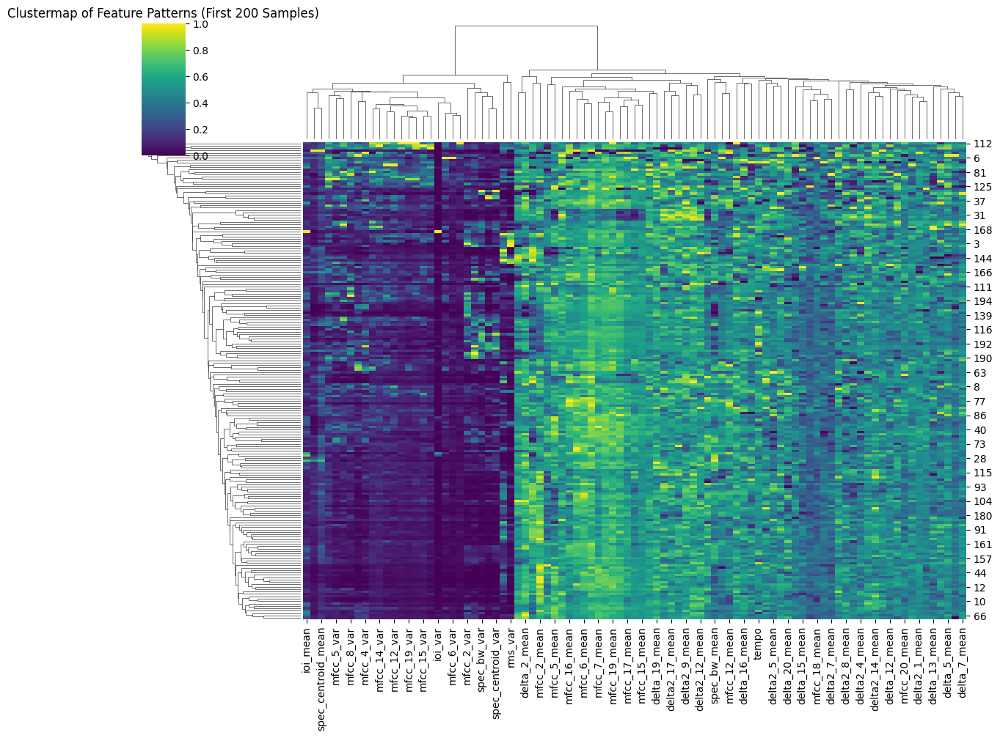

In [18]:
# === 4. Clustermap of Feature Patterns ===
sns.clustermap(X_train.iloc[:200], cmap='viridis', figsize=(12, 10), standard_scale=1)
plt.title('Clustermap of Feature Patterns (First 200 Samples)')
plt.show()



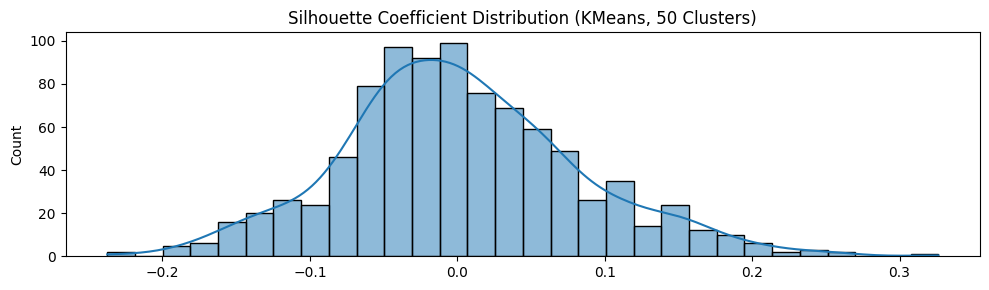

In [19]:
# === 5. Silhouette Score Distribution ===
silhouette_vals = silhouette_samples(X_train_scaled, labels_km)
plt.figure(figsize=(10, 3))
sns.histplot(silhouette_vals, bins=30, kde=True)
plt.title('Silhouette Coefficient Distribution (KMeans, 50 Clusters)')
plt.tight_layout()
plt.show()


In [20]:
# STEP 4: PCA REDUCTION
pca = PCA(n_components=50, random_state=42)
X_train_pca = pca.fit_transform(X_train_scaled)
X_val_pca = pca.transform(X_val_scaled)
X_test_pca = pca.transform(X_test_scaled)

joblib.dump(pca, os.path.join(BASE_DIR, 'train_pca.pkl'))



['/content/drive/MyDrive/audio-clustering-2402-mtl-782/train_pca.pkl']

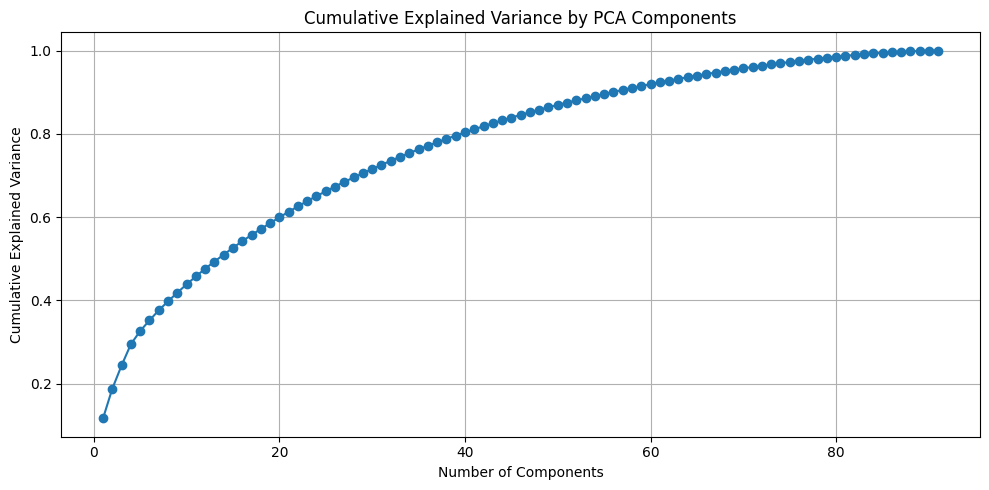

In [21]:
# Plot PCA Cumulative Explained Variance
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

pca_full = PCA().fit(X_train_scaled)
explained_var = pca_full.explained_variance_ratio_
cumulative_var = np.cumsum(explained_var)

plt.figure(figsize=(10, 5))
plt.plot(range(1, len(cumulative_var)+1), cumulative_var, marker='o')
plt.title('Cumulative Explained Variance by PCA Components')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.grid(True)
plt.tight_layout()
plt.show()


In [22]:
# STEP 5: KMEANS CLUSTERING
kmeans = KMeans(n_clusters=50, random_state=42, n_init=10)
kmeans.fit(X_train_pca)

val_preds = kmeans.predict(X_val_pca)
test_preds = kmeans.predict(X_test_pca)



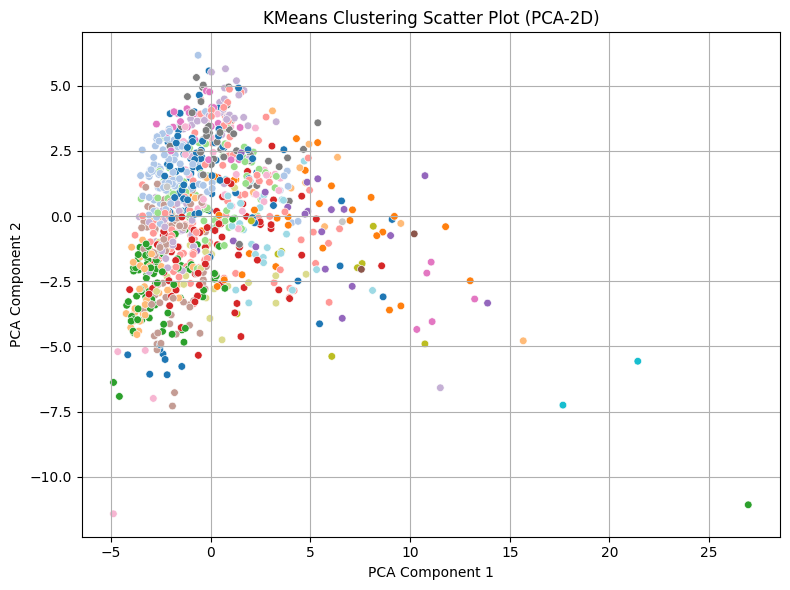

In [23]:
# Visualize KMeans Clusters (first 2 PCA components)
import seaborn as sns

plt.figure(figsize=(8, 6))
sns.scatterplot(
    x=X_train_pca[:, 0],
    y=X_train_pca[:, 1],
    hue=kmeans.labels_,
    palette='tab20',
    s=30,
    legend=False
)
plt.title('KMeans Clustering Scatter Plot (PCA-2D)')
plt.xlabel('PCA Component 1')
plt.ylabel('PCA Component 2')
plt.grid(True)
plt.tight_layout()
plt.show()


In [24]:
# STEP 6: EVALUATION
val_ari = adjusted_rand_score(y_val, val_preds)
test_ari = adjusted_rand_score(y_test, test_preds)

print(f"✅ Validation ARI: {val_ari:.4f}")
print(f"✅ Test ARI:       {test_ari:.4f}")


✅ Validation ARI: 0.0784
✅ Test ARI:       0.1050


In [25]:
# STEP 7: KMEANS HYPERPARAMETER TUNING
from sklearn.metrics import adjusted_rand_score

best_k = None
best_kmeans_ari = -1

for k in [40, 45, 50, 55, 60]:
    kmeans_tuned = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans_tuned.fit(X_train_pca)
    val_preds_k = kmeans_tuned.predict(X_val_pca)
    ari_k = adjusted_rand_score(y_val, val_preds_k)
    print(f"KMeans | n_clusters={k} → ARI={ari_k:.4f}")
    if ari_k > best_kmeans_ari:
        best_kmeans_ari = ari_k
        best_k = k

print(f"\n✅ Best KMeans: n_clusters={best_k} | Validation ARI={best_kmeans_ari:.4f}")



KMeans | n_clusters=40 → ARI=0.0668
KMeans | n_clusters=45 → ARI=0.0877
KMeans | n_clusters=50 → ARI=0.0784
KMeans | n_clusters=55 → ARI=0.0912
KMeans | n_clusters=60 → ARI=0.0837

✅ Best KMeans: n_clusters=55 | Validation ARI=0.0912


In [26]:
# STEP 8: DBSCAN FROM SCRATCH
from collections import deque
from sklearn.neighbors import NearestNeighbors

def dbscan(X, eps=0.5, min_samples=5):
    n = X.shape[0]
    labels = np.full(n, -1)  # Initially all noise
    cluster_id = 0
    visited = np.zeros(n, dtype=bool)

    # Precompute neighbors for all points
    nbrs = NearestNeighbors(radius=eps, metric='euclidean').fit(X)
    neighbors = nbrs.radius_neighbors(X, return_distance=False)

    for i in range(n):
        if visited[i]:
            continue
        visited[i] = True
        if len(neighbors[i]) < min_samples:
            labels[i] = -1  # Noise
        else:
            # Expand cluster
            labels[i] = cluster_id
            queue = deque(neighbors[i])
            while queue:
                j = queue.popleft()
                if not visited[j]:
                    visited[j] = True
                    if len(neighbors[j]) >= min_samples:
                        queue.extend(neighbors[j])
                if labels[j] == -1:
                    labels[j] = cluster_id
            cluster_id += 1
    return labels



In [27]:
# STEP 9: DBSCAN HYPERPARAMETER TUNING
best_dbscan_params = None
best_dbscan_ari = -1

for eps in [5, 7.5, 10, 12.5]:
    for min_pts in [3, 5, 7]:
        val_preds_db = dbscan(X_val_pca, eps=eps, min_samples=min_pts)
        # Remove noise points (-1) from ARI eval
        mask = val_preds_db != -1
        if mask.sum() == 0:
            continue  # skip if everything is noise
        ari_db = adjusted_rand_score(y_val[mask], np.array(val_preds_db)[mask])
        print(f"DBSCAN | eps={eps:.1f}, min_samples={min_pts} → ARI={ari_db:.4f}")
        if ari_db > best_dbscan_ari:
            best_dbscan_ari = ari_db
            best_dbscan_params = (eps, min_pts)

print(f"\n✅ Best DBSCAN: eps={best_dbscan_params[0]}, min_samples={best_dbscan_params[1]} | Validation ARI={best_dbscan_ari:.4f}")


DBSCAN | eps=5.0, min_samples=3 → ARI=0.1972
DBSCAN | eps=5.0, min_samples=5 → ARI=0.0000
DBSCAN | eps=7.5, min_samples=3 → ARI=0.0000
DBSCAN | eps=7.5, min_samples=5 → ARI=0.0000
DBSCAN | eps=7.5, min_samples=7 → ARI=0.0000
DBSCAN | eps=10.0, min_samples=3 → ARI=0.0000
DBSCAN | eps=10.0, min_samples=5 → ARI=0.0000
DBSCAN | eps=10.0, min_samples=7 → ARI=0.0000
DBSCAN | eps=12.5, min_samples=3 → ARI=0.0000
DBSCAN | eps=12.5, min_samples=5 → ARI=0.0000
DBSCAN | eps=12.5, min_samples=7 → ARI=0.0000

✅ Best DBSCAN: eps=5, min_samples=3 | Validation ARI=0.1972


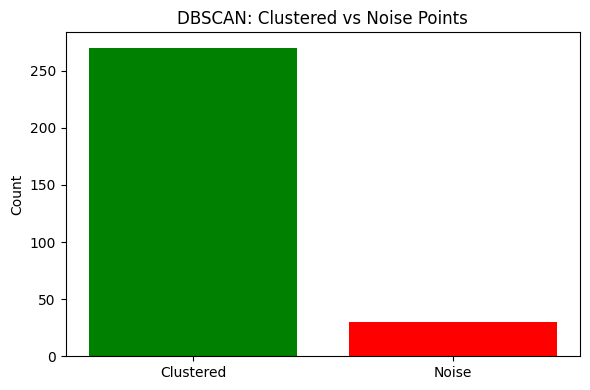

In [28]:
# Plot DBSCAN Noise vs Clustered Points Ratio
val_preds_db = dbscan(X_val_pca, eps=10, min_samples=5)
labels_db = np.array(val_preds_db)

n_total = len(labels_db)
n_noise = np.sum(labels_db == -1)
n_clustered = n_total - n_noise

plt.figure(figsize=(6, 4))
plt.bar(['Clustered', 'Noise'], [n_clustered, n_noise], color=['green', 'red'])
plt.title('DBSCAN: Clustered vs Noise Points')
plt.ylabel('Count')
plt.tight_layout()
plt.show()


In [29]:
# 🛠️ Use best found hyperparameters
best_eps = 5
best_min_samples = 3

# 🎯 Apply PCA transform to test set (already done earlier as X_test_pca)
# 📦 Run DBSCAN on test data
test_preds_db = dbscan(X_test_pca, eps=best_eps, min_samples=best_min_samples)

# 🧼 Remove noise points for fair ARI computation
test_preds_db = np.array(test_preds_db)
mask = test_preds_db != -1

# ✅ Compute ARI
from sklearn.metrics import adjusted_rand_score
test_ari_dbscan = adjusted_rand_score(y_test[mask], test_preds_db[mask])
print(f"🌟 Test ARI (DBSCAN with eps={best_eps}, min_samples={best_min_samples}): {test_ari_dbscan:.4f}")


🌟 Test ARI (DBSCAN with eps=5, min_samples=3): 0.1053


In [ ]:
)